# Inventory Detection System - GPU Approach

This notebook demonstrates using YOLOv8 and transfer learning to detect and count Pepsi and Kilimanjaro products in shelf images.

## Overview

**Problem**: Manual counting of inventory takes hours each week and is often skipped, causing errors.

**Solution**: We'll implement a GPU-accelerated computer vision model that can accurately detect and count specific products.

**Advantages**:
- Higher accuracy than API approach
- Local processing (no internet required)
- Faster inference with GPU acceleration
- More control over the detection parameters

## 1. Setup and Imports

In [1]:
# Install required packages
!pip install torch torchvision scikit-learn opencv-python pillow matplotlib ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.9 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 2.4 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 29.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 12.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.9 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 66.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 48.2 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.9.41
    Uninstalling nvidia-nvjitlink-cu12-12.9.41:
      Successfully uninstalled nvidia-nvjitlink-cu12-12.9.41
  Attempting uninstall: nvidia-curand-cu12
    Found existing ins

In [2]:
import os
import json
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import torch
from torchvision.models import resnet50, ResNet50_Weights
from torchvision import transforms
from sklearn.metrics.pairwise import cosine_similarity
from IPython.display import display

## 2. Check for GPU Availability

Let's check if a GPU is available for acceleration.

In [3]:
# Check for GPU
if torch.cuda.is_available():
    device = torch.device("cuda")
    print(f"✅ GPU is available: {torch.cuda.get_device_name(0)}")
else:
    device = torch.device("cpu")
    print("⚠️ GPU is not available. Using CPU instead. Processing may be slower.")

✅ GPU is available: Tesla T4


## 3. Load Models

We'll use two pre-trained models:
1. YOLOv8 for general object detection
2. ResNet50 for feature extraction and product classification

In [4]:
from ultralytics import YOLO

def load_models():
    """Load pre-trained models."""
    print("Loading pre-trained models...")
    
    # Load YOLOv8 for general object detection
    try:
        object_detector = YOLO('yolov8n.pt')
        print("✅ YOLOv8 loaded successfully!")
    except Exception as e:
        print(f"❌ Error loading YOLOv8: {e}")
        return None, None
    
    # Load ResNet50 for feature extraction
    try:
        feature_extractor = resnet50(weights=ResNet50_Weights.IMAGENET1K_V2)
        feature_extractor.eval()
        if torch.cuda.is_available():
            feature_extractor = feature_extractor.cuda()
        print("✅ ResNet50 loaded successfully!")
    except Exception as e:
        print(f"❌ Error loading ResNet50: {e}")
        return object_detector, None
    
    return object_detector, feature_extractor

# Load models
object_detector, feature_extractor = load_models()

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Loading pre-trained models...
✅ YOLOv8 loaded successfully!


Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 163MB/s]


✅ ResNet50 loaded successfully!


## 4. View Sample Products

Let's first look at our sample product images to understand what we're looking for.

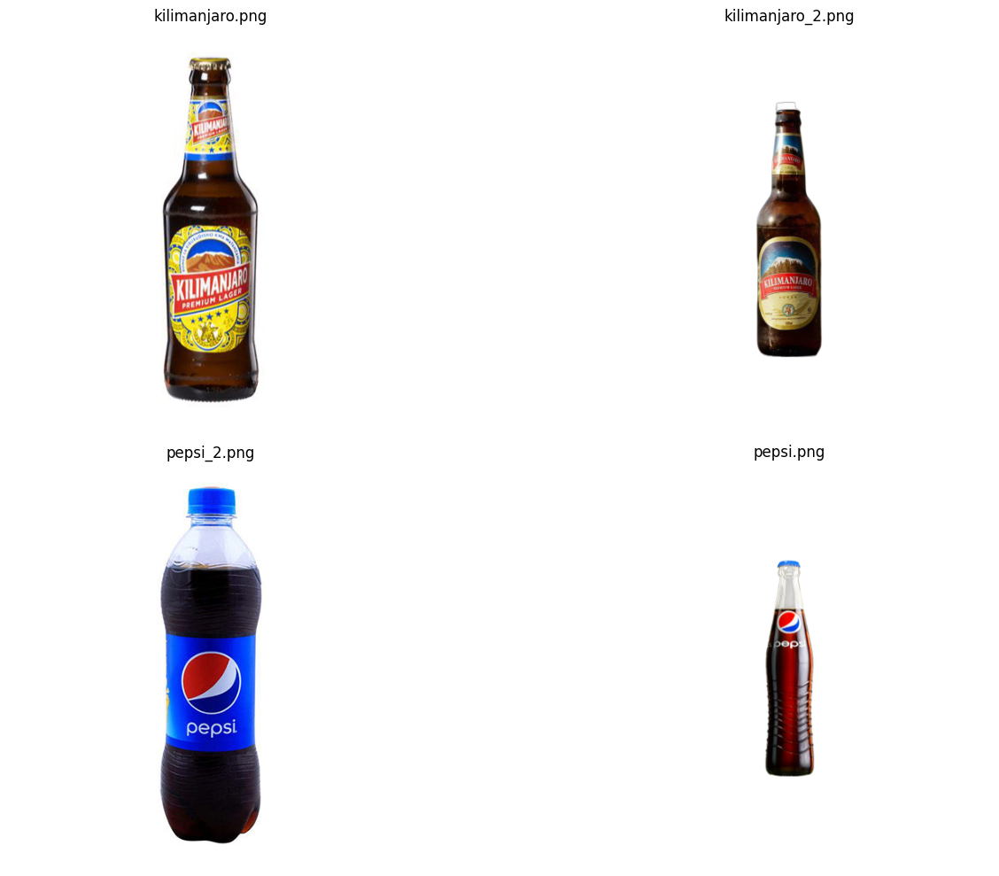

In [5]:
# Display sample images
sample_dir = "/kaggle/input/dftr-data/data/sample_images"
sample_images = [f for f in os.listdir(sample_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

plt.figure(figsize=(15, 10))
for i, image_file in enumerate(sample_images):
    image_path = os.path.join(sample_dir, image_file)
    img = Image.open(image_path)
    
    plt.subplot(2, 2, i+1)
    plt.imshow(img)
    plt.title(image_file)
    plt.axis('off')
    
plt.tight_layout()
plt.show()

## 5. Extract Features from Sample Images

I'll extract features from the sample images to use as reference for detecting similar products.

In [6]:
def load_sample_features(feature_extractor, sample_dir):
    """Extract features from sample images."""
    print(f"Extracting features from sample images in {sample_dir}...")
    
    # Define image transformation
    transform = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        # transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    
    # Get all sample images
    sample_files = [f for f in os.listdir(sample_dir) 
                   if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    
    # Initialize feature dictionaries
    pepsi_features = []
    kilimanjaro_features = []
    
    # Extract features from each sample
    for sample_file in sample_files:
        # Determine product type from filename
        product_type = "unknown"
        if "pepsi" in sample_file.lower():
            product_type = "pepsi"
        elif "kilimanjaro" in sample_file.lower():
            product_type = "kilimanjaro"
        else:
            print(f"Unknown product in sample: {sample_file}")
            continue
        
        print(f"Extracting features from {sample_file} ({product_type})...")
        
        # Load and process image
        image_path = os.path.join(sample_dir, sample_file)
        image = Image.open(image_path).convert('RGB')
        input_tensor = transform(image)
        input_batch = input_tensor.unsqueeze(0)
        
        if torch.cuda.is_available():
            input_batch = input_batch.cuda()
        
        # Extract features
        with torch.no_grad():
            features = feature_extractor(input_batch)
        
        # Store features
        if product_type == "pepsi":
            pepsi_features.append(features.cpu().numpy().flatten())
        elif product_type == "kilimanjaro":
            kilimanjaro_features.append(features.cpu().numpy().flatten())
    
    # Average features for each product type
    sample_features = {
        "pepsi": np.mean(pepsi_features, axis=0) if pepsi_features else None,
        "kilimanjaro": np.mean(kilimanjaro_features, axis=0) if kilimanjaro_features else None
    }
    
    print("✅ Sample features extracted successfully!")
    
    return sample_features

# Extract features from sample images
sample_features = load_sample_features(feature_extractor, sample_dir)

Extracting features from sample images in /kaggle/input/dftr-data/data/sample_images...
Extracting features from kilimanjaro.png (kilimanjaro)...
Extracting features from kilimanjaro_2.png (kilimanjaro)...
Extracting features from pepsi_2.png (pepsi)...
Extracting features from pepsi.png (pepsi)...
✅ Sample features extracted successfully!


## 6. Product Detection Function

Now let me implement the product detection function that uses both YOLOv8 for object detection and ResNet50 for feature extraction.

In [7]:
def detect_products(object_detector, feature_extractor, sample_features, image_path, conf_threshold=0.25):
    """Detect Pepsi and Kilimanjaro products in an image."""
    try:
        # Load image
        image = Image.open(image_path).convert('RGB')
        image_np = np.array(image)
        
        # Display the image
        plt.figure(figsize=(12, 8))
        plt.imshow(image)
        plt.axis('off')
        plt.title('Input Image')
        plt.show()
        
        # Define transformation
        transform = transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            # transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])
        
        # Detect objects
        results = object_detector(image_path, conf=conf_threshold)
        
        # Initialize counts and detections
        pepsi_count = 0
        kilimanjaro_count = 0
        detections = []
        
        # Image dimensions for percentage calculations
        img_width, img_height = image.size
        
        # Process each detection
        for result in results:
            boxes = result.boxes
            
            # Display YOLO detections
            plt.figure(figsize=(12, 8))
            plt.imshow(result.plot())
            plt.axis('off')
            plt.title('YOLO Detections (All Objects)')
            plt.show()
            
            for box in boxes:
                # Get class, coordinates, and confidence
                class_id = int(box.cls.item())
                xyxy = box.xyxy.tolist()[0]  # Get box in xyxy format
                confidence = box.conf.item()
                
                # Skip if not a bottle or can (class 39 in COCO is bottle)
                if class_id != 39:  # Bottle in COCO dataset
                    continue
                
                # Calculate percentage coordinates
                x_percent = (xyxy[0] / img_width) * 100
                y_percent = (xyxy[1] / img_height) * 100
                width_percent = ((xyxy[2] - xyxy[0]) / img_width) * 100
                height_percent = ((xyxy[3] - xyxy[1]) / img_height) * 100
                
                # Crop the detection
                x1, y1, x2, y2 = int(xyxy[0]), int(xyxy[1]), int(xyxy[2]), int(xyxy[3])
                cropped_img = image_np[y1:y2, x1:x2]
                
                if cropped_img.size == 0:
                    continue
                
                # Convert cropped image to PIL
                cropped_pil = Image.fromarray(cropped_img)
                
                # Extract features
                input_tensor = transform(cropped_pil)
                input_batch = input_tensor.unsqueeze(0)
                
                if torch.cuda.is_available():
                    input_batch = input_batch.cuda()
                
                with torch.no_grad():
                    features = feature_extractor(input_batch)
                
                # Compare with sample features
                detection_features = features.cpu().numpy().flatten()
                
                pepsi_similarity = 0
                kilimanjaro_similarity = 0
                
                if sample_features["pepsi"] is not None:
                    pepsi_similarity = cosine_similarity(
                        detection_features.reshape(1, -1),
                        sample_features["pepsi"].reshape(1, -1)
                    )[0][0]
                
                if sample_features["kilimanjaro"] is not None:
                    kilimanjaro_similarity = cosine_similarity(
                        detection_features.reshape(1, -1),
                        sample_features["kilimanjaro"].reshape(1, -1)
                    )[0][0]
                
                # Determine product type
                similarity_threshold = 0.5
                product = "unknown"
                product_confidence = 0
                
                if pepsi_similarity > similarity_threshold and pepsi_similarity > kilimanjaro_similarity:
                    product = "pepsi"
                    product_confidence = pepsi_similarity
                    pepsi_count += 1
                elif kilimanjaro_similarity > similarity_threshold and kilimanjaro_similarity > pepsi_similarity:
                    product = "kilimanjaro"
                    product_confidence = kilimanjaro_similarity
                    kilimanjaro_count += 1
                else:
                    continue  # Skip unknown products
                
                # Add detection
                detections.append({
                    "product": product,
                    "confidence": float(product_confidence),
                    "x": float(x_percent),
                    "y": float(y_percent),
                    "width": float(width_percent),
                    "height": float(height_percent)
                })
                
                # Display the cropped bottle
                plt.figure(figsize=(3, 3))
                plt.imshow(cropped_pil)
                plt.title(f"{product.capitalize()} ({product_confidence:.2f})")
                plt.axis('off')
                plt.show()
        
        # Create result dictionary
        result = {
            "pepsi_count": pepsi_count,
            "kilimanjaro_count": kilimanjaro_count,
            "detections": detections
        }
        
        return result
    
    except Exception as e:
        print(f"Error detecting products: {e}")
        return {"pepsi_count": 0, "kilimanjaro_count": 0, "detections": []}

## 7. Visualization Function

Let me create a function to visualize the detection results.

In [8]:
def visualize_results(image_path, results):
    """Visualize detection results on the image."""
    try:
        # Read the image
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        # Get image dimensions
        img_height, img_width = image.shape[:2]
        
        # Create figure and axis
        fig, ax = plt.subplots(1, figsize=(12, 9))
        ax.imshow(image)
        
        # Draw bounding boxes
        for detection in results.get("detections", []):
            product = detection.get("product", "").lower()
            x = detection.get("x", 0) * img_width / 100
            y = detection.get("y", 0) * img_height / 100
            width = detection.get("width", 0) * img_width / 100
            height = detection.get("height", 0) * img_height / 100
            confidence = detection.get("confidence", 0)
            
            # Create rectangle patch
            color = 'red' if 'pepsi' in product else 'green'
            rect = patches.Rectangle((x, y), width, height, linewidth=2, edgecolor=color, facecolor='none')
            ax.add_patch(rect)
            
            # Add label
            plt.text(x, y-5, f"{product} {confidence:.2f}", color='white', fontsize=12, 
                     bbox=dict(facecolor=color, alpha=0.7))
        
        # Add counts as text
        plt.text(10, 30, f"Pepsi: {results.get('pepsi_count', 0)}", 
                 color='white', fontsize=14, bbox=dict(facecolor='red', alpha=0.7))
        plt.text(10, 70, f"Kilimanjaro: {results.get('kilimanjaro_count', 0)}", 
                 color='white', fontsize=14, bbox=dict(facecolor='green', alpha=0.7))
        
        # Remove axis ticks
        plt.axis('off')
        plt.title('Final Detection Results')
        
        # Show the visualization
        plt.tight_layout()
        plt.show()
        
    except Exception as e:
        print(f"Error visualizing results: {e}")

## 8. Process an Inventory Image

Now I'll process one of the inventory images to detect products.

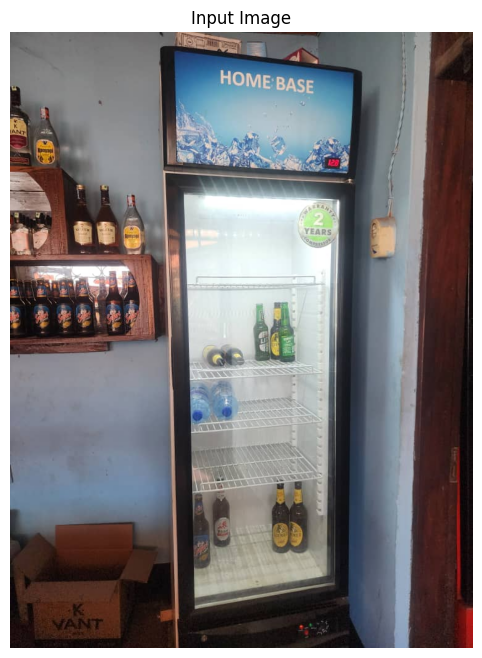


image 1/1 /kaggle/input/dftr-data/data/inventory_images/Customer_Stock_2025-04-30 at 12.44.34.jpeg: 640x480 21 bottles, 1 tv, 2 refrigerators, 45.9ms
Speed: 8.4ms preprocess, 45.9ms inference, 250.8ms postprocess per image at shape (1, 3, 640, 480)


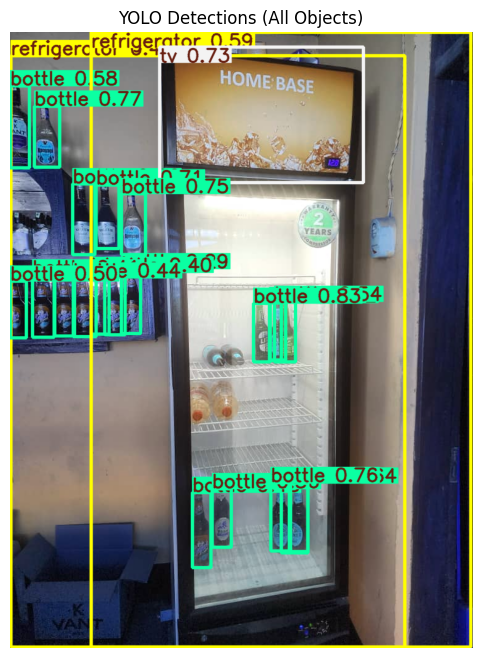


Results for Customer_Stock_2025-04-30 at 12.44.34.jpeg:
Pepsi count: 0
Kilimanjaro count: 0


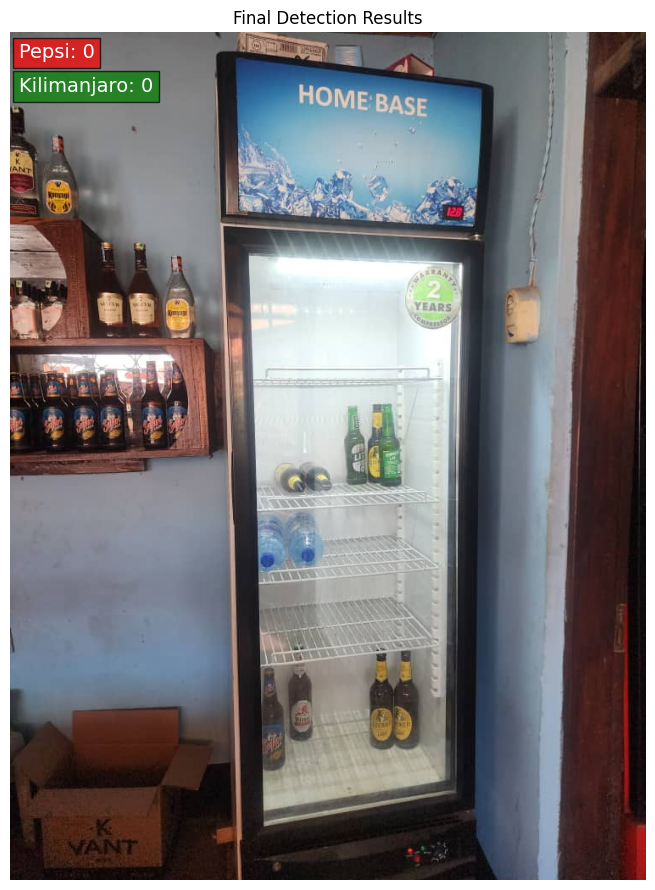

In [9]:
# Choose an inventory image to process
inventory_dir = "/kaggle/input/dftr-data/data/inventory_images"
image_file = "Customer_Stock_2025-04-30 at 12.44.34.jpeg"  # Change this to process a different image
image_path = os.path.join(inventory_dir, image_file)

# Set confidence threshold
conf_threshold = 0.25

# Detect products
results = detect_products(object_detector, feature_extractor, sample_features, image_path, conf_threshold)

# Print results
print(f"\nResults for {image_file}:")
print(f"Pepsi count: {results.get('pepsi_count', 0)}")
print(f"Kilimanjaro count: {results.get('kilimanjaro_count', 0)}")

# Visualize results
visualize_results(image_path, results)

## 9. Process All Inventory Images

Let's process all inventory images and compile the results.

In [10]:
def process_all_images(object_detector, feature_extractor, sample_features, input_dir, conf_threshold=0.25):
    """Process all images in a directory."""
    # Get all image files
    image_files = [f for f in os.listdir(input_dir) 
                  if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    
    results = {}
    
    # Process each image
    for image_file in image_files:
        image_path = os.path.join(input_dir, image_file)
        print(f"\nProcessing {image_file}...")
        
        # Detect products
        detection_results = detect_products(
            object_detector, feature_extractor, sample_features, image_path, conf_threshold
        )
        
        # Save results
        results[image_file] = {
            "pepsi_count": detection_results.get("pepsi_count", 0),
            "kilimanjaro_count": detection_results.get("kilimanjaro_count", 0)
        }
        
        # Visualize results
        visualize_results(image_path, detection_results)
        
        print(f"Results for {image_file}:")
        print(f"  Pepsi count: {detection_results.get('pepsi_count', 0)}")
        print(f"  Kilimanjaro count: {detection_results.get('kilimanjaro_count', 0)}")
    
    return results


Processing Customer_Stock_2025-04-30 at 12.44.35_3.jpeg...


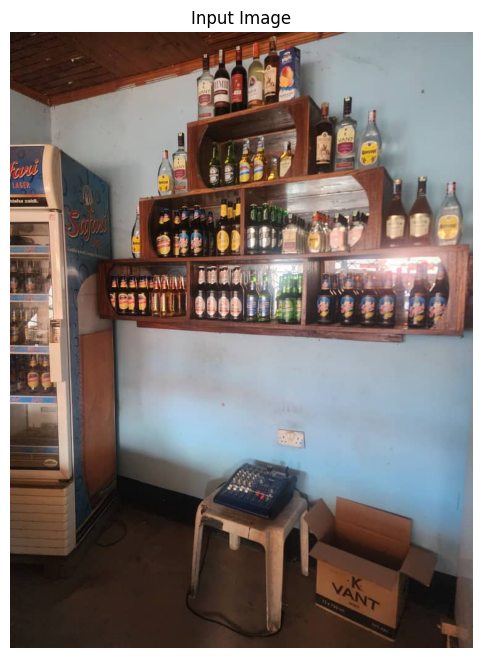


image 1/1 /kaggle/input/dftr-data/data/inventory_images/Customer_Stock_2025-04-30 at 12.44.35_3.jpeg: 640x480 46 bottles, 2 refrigerators, 7.4ms
Speed: 2.5ms preprocess, 7.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 480)


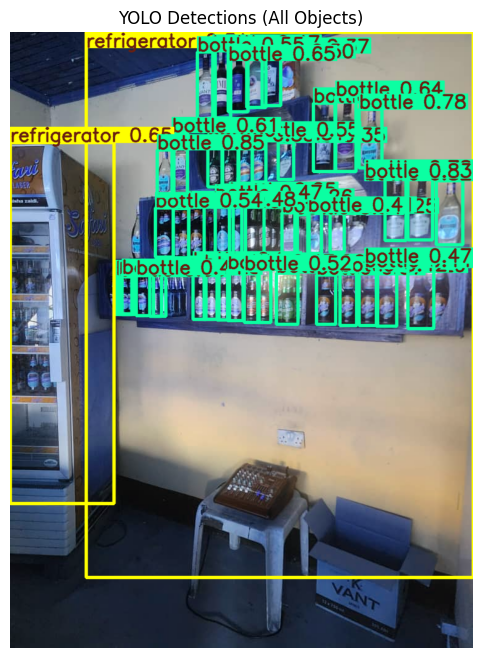

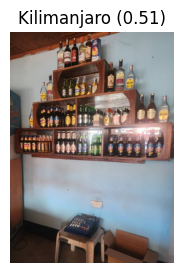

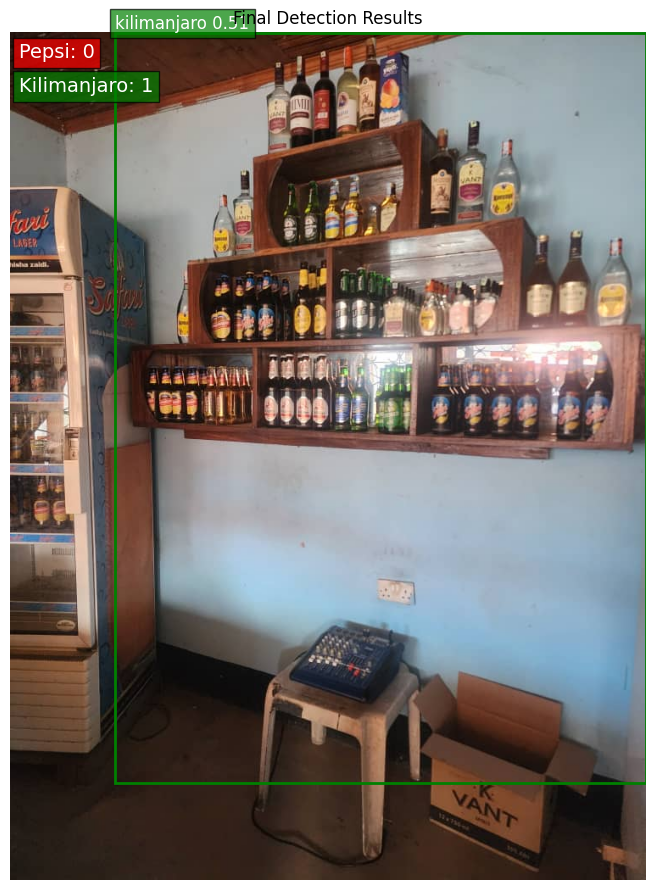

Results for Customer_Stock_2025-04-30 at 12.44.35_3.jpeg:
  Pepsi count: 0
  Kilimanjaro count: 1

Processing Customer_Stock_2025-04-30 at 12.44.33_1.jpeg...


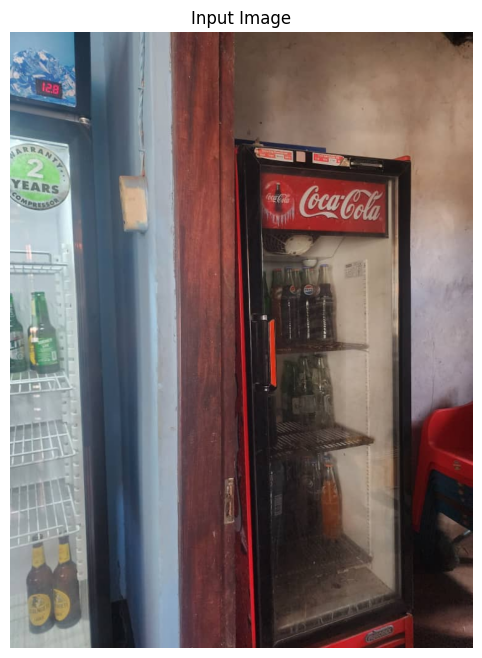


image 1/1 /kaggle/input/dftr-data/data/inventory_images/Customer_Stock_2025-04-30 at 12.44.33_1.jpeg: 640x480 6 bottles, 1 chair, 2 refrigerators, 9.6ms
Speed: 3.0ms preprocess, 9.6ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 480)


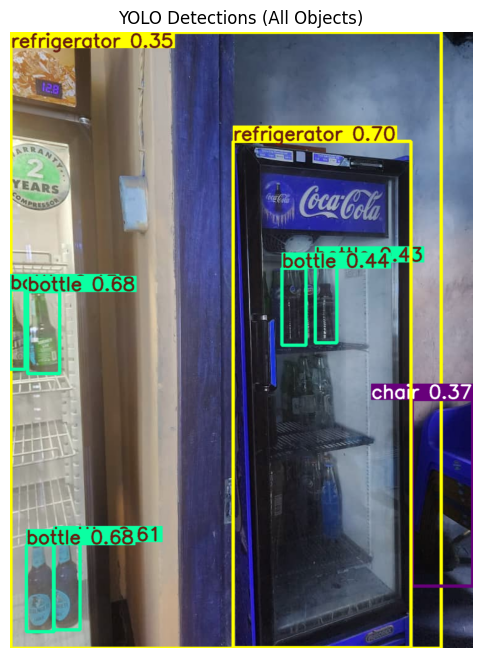

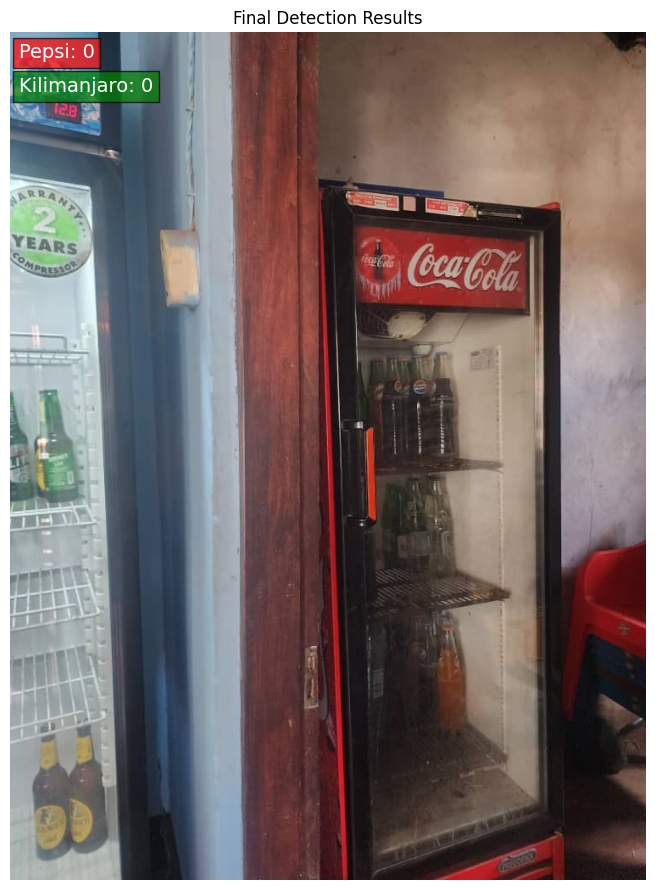

Results for Customer_Stock_2025-04-30 at 12.44.33_1.jpeg:
  Pepsi count: 0
  Kilimanjaro count: 0

Processing Customer_Stock_2025-04-30 at 12.44.34_2.jpeg...


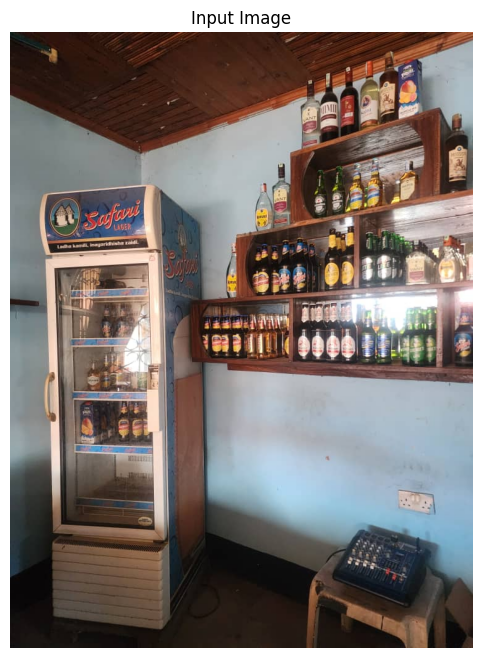


image 1/1 /kaggle/input/dftr-data/data/inventory_images/Customer_Stock_2025-04-30 at 12.44.34_2.jpeg: 640x480 30 bottles, 1 refrigerator, 10.6ms
Speed: 3.8ms preprocess, 10.6ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 480)


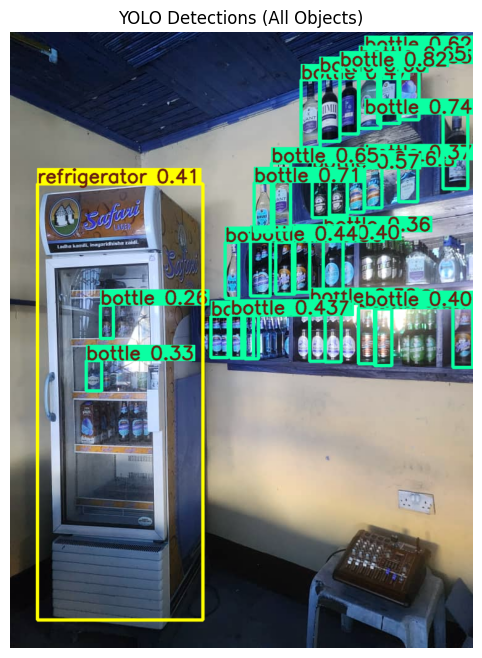

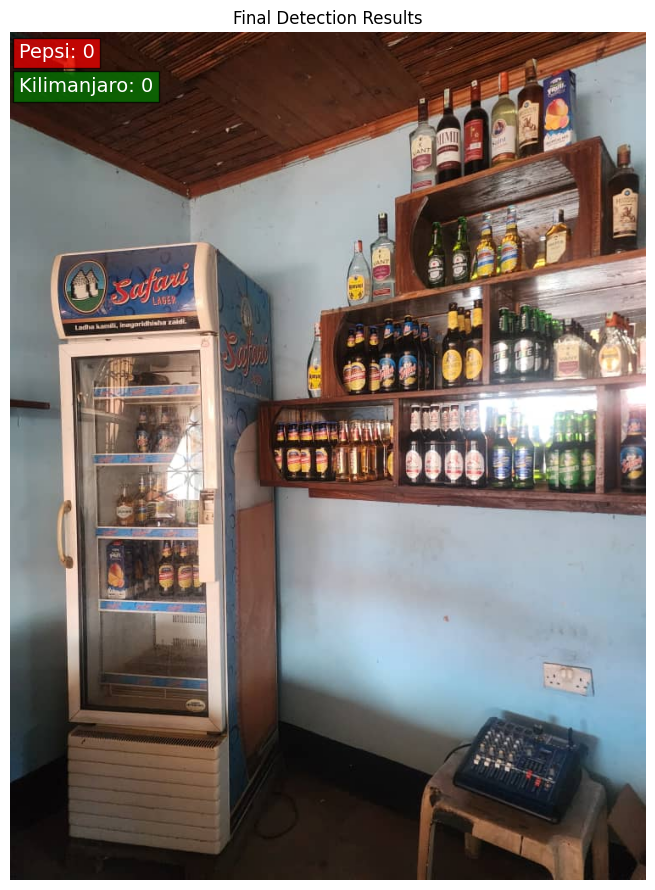

Results for Customer_Stock_2025-04-30 at 12.44.34_2.jpeg:
  Pepsi count: 0
  Kilimanjaro count: 0

Processing Customer_Stock_2025-04-30 at 12.44.34.jpeg...


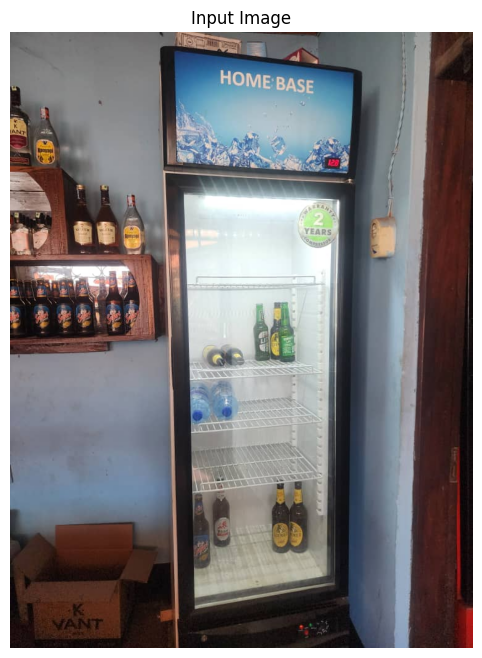


image 1/1 /kaggle/input/dftr-data/data/inventory_images/Customer_Stock_2025-04-30 at 12.44.34.jpeg: 640x480 21 bottles, 1 tv, 2 refrigerators, 7.3ms
Speed: 2.5ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 480)


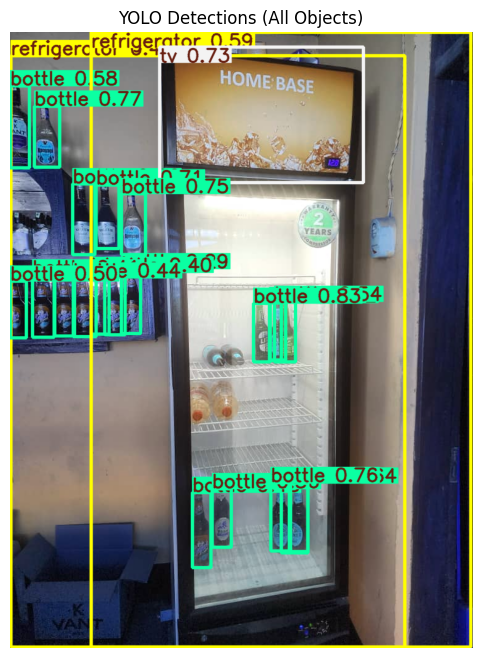

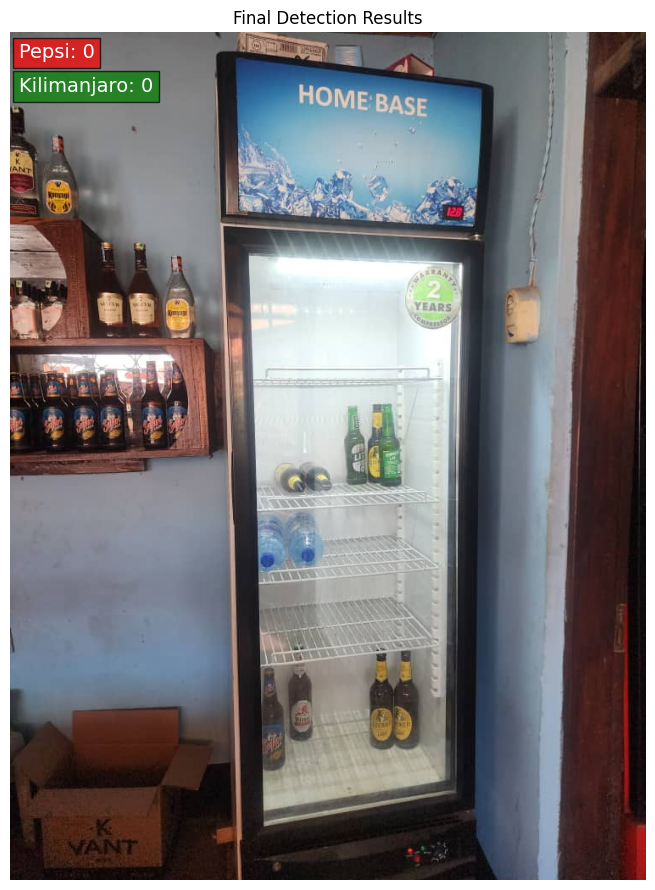

Results for Customer_Stock_2025-04-30 at 12.44.34.jpeg:
  Pepsi count: 0
  Kilimanjaro count: 0

Processing Customer_Stock_2025-04-30 at 12.44.33.jpeg...


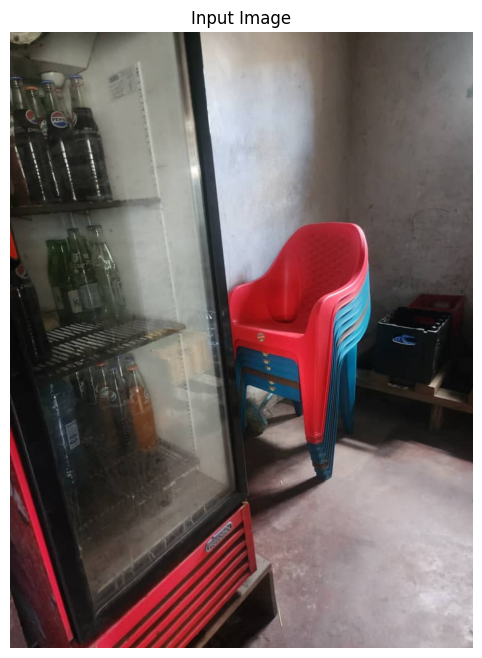


image 1/1 /kaggle/input/dftr-data/data/inventory_images/Customer_Stock_2025-04-30 at 12.44.33.jpeg: 640x480 1 bottle, 1 chair, 7.5ms
Speed: 2.5ms preprocess, 7.5ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 480)


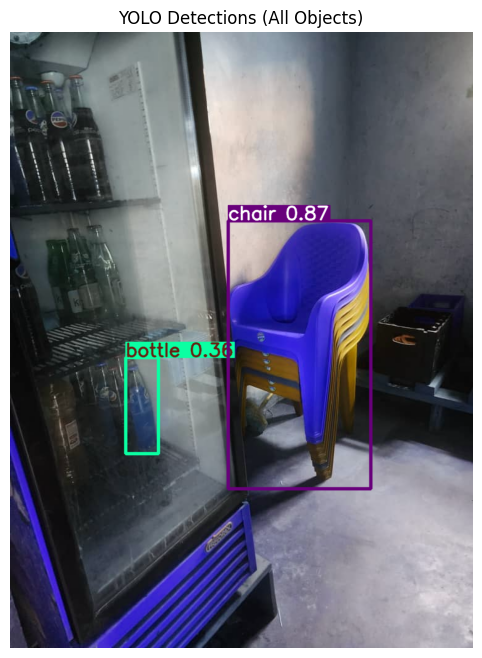

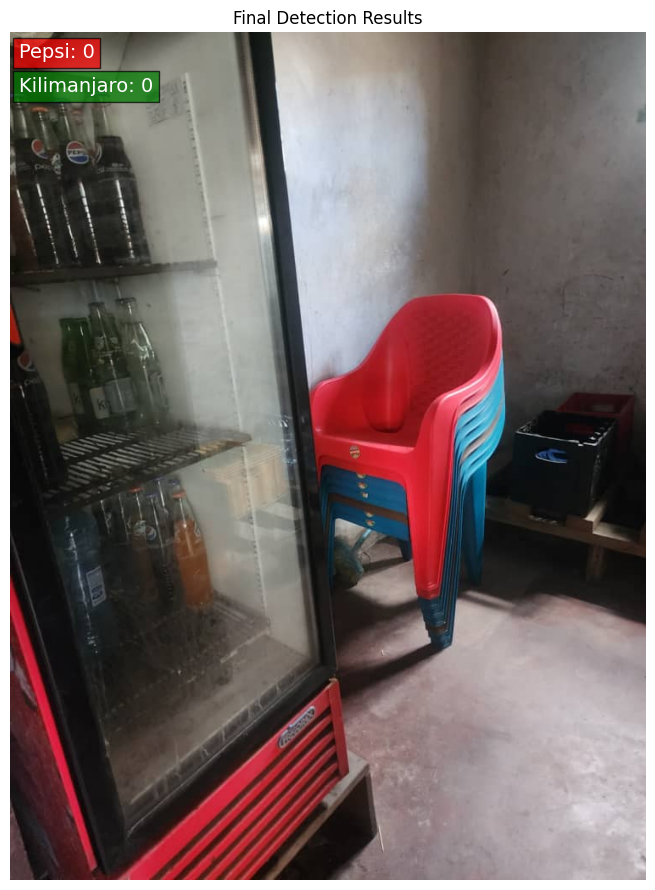

Results for Customer_Stock_2025-04-30 at 12.44.33.jpeg:
  Pepsi count: 0
  Kilimanjaro count: 0

Summary results saved to outputs/gpu/summary_results.json


In [11]:
# Set confidence threshold
conf_threshold = 0.25

# Process all inventory images
all_results = process_all_images(
    object_detector, feature_extractor, sample_features, inventory_dir, conf_threshold
)

# Save results to JSON
output_dir = "outputs/gpu"
os.makedirs(output_dir, exist_ok=True)
summary_path = os.path.join(output_dir, "summary_results.json")

with open(summary_path, 'w') as f:
    json.dump(all_results, f, indent=2)

print(f"\nSummary results saved to {summary_path}")

## 10. Analyze Results

Let's visualize the results across all images.

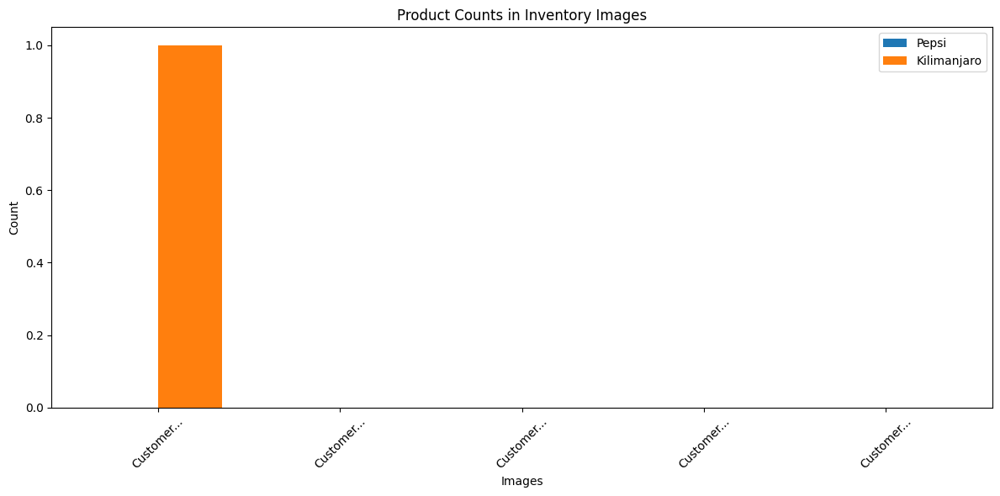

In [12]:
# Create a summary visualization
image_names = list(all_results.keys())
pepsi_counts = [all_results[img]['pepsi_count'] for img in image_names]
kilimanjaro_counts = [all_results[img]['kilimanjaro_count'] for img in image_names]

# Plot
plt.figure(figsize=(12, 6))
x = range(len(image_names))
width = 0.35

plt.bar([i - width/2 for i in x], pepsi_counts, width, label='Pepsi')
plt.bar([i + width/2 for i in x], kilimanjaro_counts, width, label='Kilimanjaro')

plt.xlabel('Images')
plt.ylabel('Count')
plt.title('Product Counts in Inventory Images')
plt.xticks(x, [img.split('_')[0] + '...' for img in image_names], rotation=45)
plt.legend()
plt.tight_layout()
plt.show()

## 11. Advanced: YOLOv8 Fine-Tuning (Optional)

For even better results, we could fine-tune YOLOv8 on our specific products. This requires annotated data, which we would create using tools like LabelImg.

Here's how we would approach this step:

In [13]:
# This code is for reference and would require annotated data to run

def train_yolo_model(data_path, epochs=50, batch_size=4):
    """Train a YOLOv8 model on our dataset."""
    print(f"Training YOLOv8 model on {data_path} for {epochs} epochs...")
    
    # Load a pre-trained YOLOv8 model
    model = YOLO('yolov8n.pt')
    
    # Train the model
    try:
        results = model.train(
            data=data_path,
            epochs=epochs,
            batch=batch_size,
            imgsz=640,
            patience=15,
            save=True
        )
        print("Training completed successfully!")
        return model
    except Exception as e:
        print(f"Error during training: {e}")
        return None

# Example usage (commented out as it requires annotated data)
# model = train_yolo_model("yolo_dataset/dataset.yaml", epochs=50, batch_size=4)

## 12. Conclusion

### Advantages of the GPU Approach:
- **Higher accuracy**: More precise than the API approach
- **Local processing**: Works without internet connection
- **Faster inference**: GPU acceleration enables real-time processing
- **More control**: Can fine-tune parameters and models for specific use cases

### Limitations:
- **Hardware requirements**: Needs GPU for optimal performance
- **Setup complexity**: More complex to set up than the API approach
- **Training data**: Fine-tuning requires annotated data

### Next Steps:
- Implement the mobile approach for on-device deployment
- Collect more training data for fine-tuning
- Optimize for faster inference on edge devices